(GLM-rolling-regression)=
# Rolling Regression

:::{post} Jan 28, 2023
:tags: generalized linear model, regression 
:category: intermediate
:author: Thomas Wiecki
:::

* [Pairs trading](https://en.wikipedia.org/wiki/Pairs_trade?oldformat=true) is a famous technique in algorithmic trading that plays two stocks against each other.
* For this to work, stocks must be correlated (cointegrated).
* One common example is the price of gold (AGE) and the price of gold mining operations (FREQ).

In [1]:
import os
import warnings

import arviz as az
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
%matplotlib inline
# %config InlineBackend.figure_format='svg'
%config InlineBackend.figure_format = 'retina'
%load_ext vscode_plot_theme

import numpy as np
import pandas as pd
import pymc as pm
import xarray as xr

from matplotlib import MatplotlibDeprecationWarning

warnings.filterwarnings(action="ignore", category=MatplotlibDeprecationWarning)

In [2]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
#az.style.use("arviz-darkgrid")

Lets load the prices of FREQ and AGE.

In [4]:
# from pandas_datareader import data
# prices = data.GoogleDailyReader(symbols=['AGE', 'FREQ'], end='2014-8-1').read().loc['Open', :, :]
try:
    prices = pd.read_csv(os.path.join("..", "data", "stock_prices.csv")).dropna()
except FileNotFoundError:
    prices = pd.read_csv(pm.get_data("stock_prices.csv")).dropna()

prices = prices.rename(columns={"GFI": "FREQ", "GLD": "AGE", "Date": "POS"})

dt_index = pd.DatetimeIndex(prices["POS"])
days = (dt_index - dt_index[0]).days

In [5]:
# from pandas_datareader import data
# prices = data.GoogleDailyReader(symbols=['AGE', 'FREQ'], end='2014-8-1').read().loc['Open', :, :]
try:
    prices = pd.read_csv(os.path.join("..", "data", "stock_prices.csv")).dropna()
except FileNotFoundError:
    prices = pd.read_csv(pm.get_data("stock_prices.csv")).dropna()

prices = prices.rename(columns={"GFI": "FREQ", "GLD": "AGE", "Date": "POS"})

dt_index = pd.DatetimeIndex(prices["POS"])
prices["POS"] = (dt_index - dt_index[0]).days

prices["STAT"] = prices["FREQ"] / prices["AGE"] * 200 * np.random.uniform(0.9, 1.1, len(prices))

prices = prices.set_index("POS")
prices.head()


,FREQ,AGE,STAT
POS,,,
0,13.55,109.82,27.141193
1,13.51,109.88,23.334870
2,13.70,110.71,24.410299
3,13.63,111.07,24.513437
4,13.72,111.52,26.652703


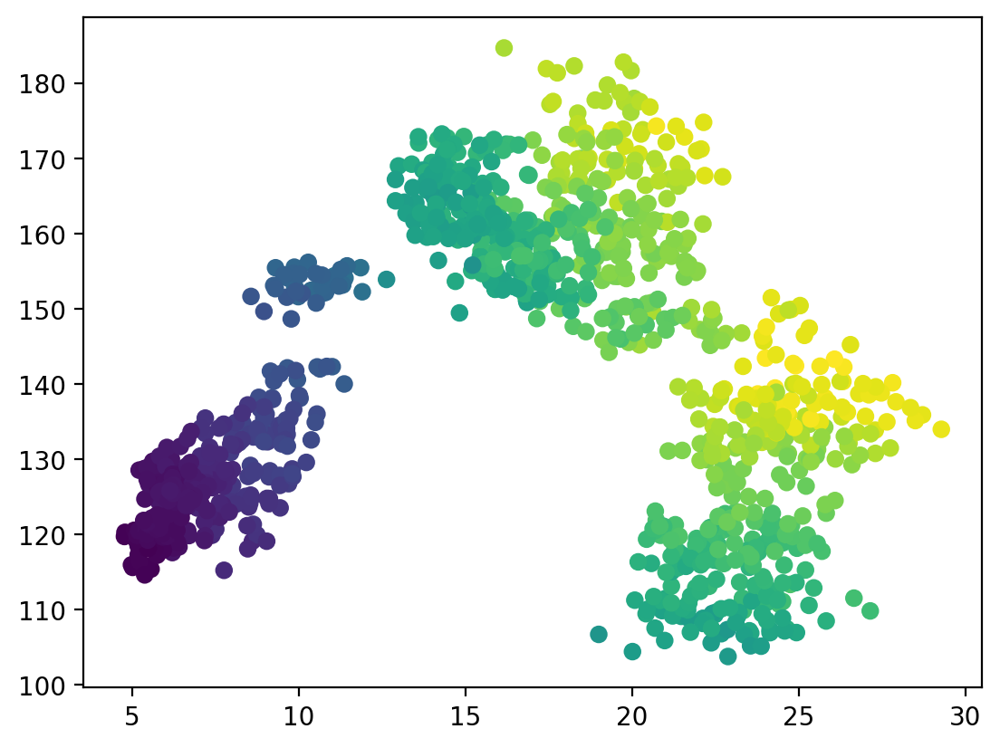

In [6]:
plt.scatter(prices["STAT"], prices["AGE"], c=prices["FREQ"], cmap="viridis")

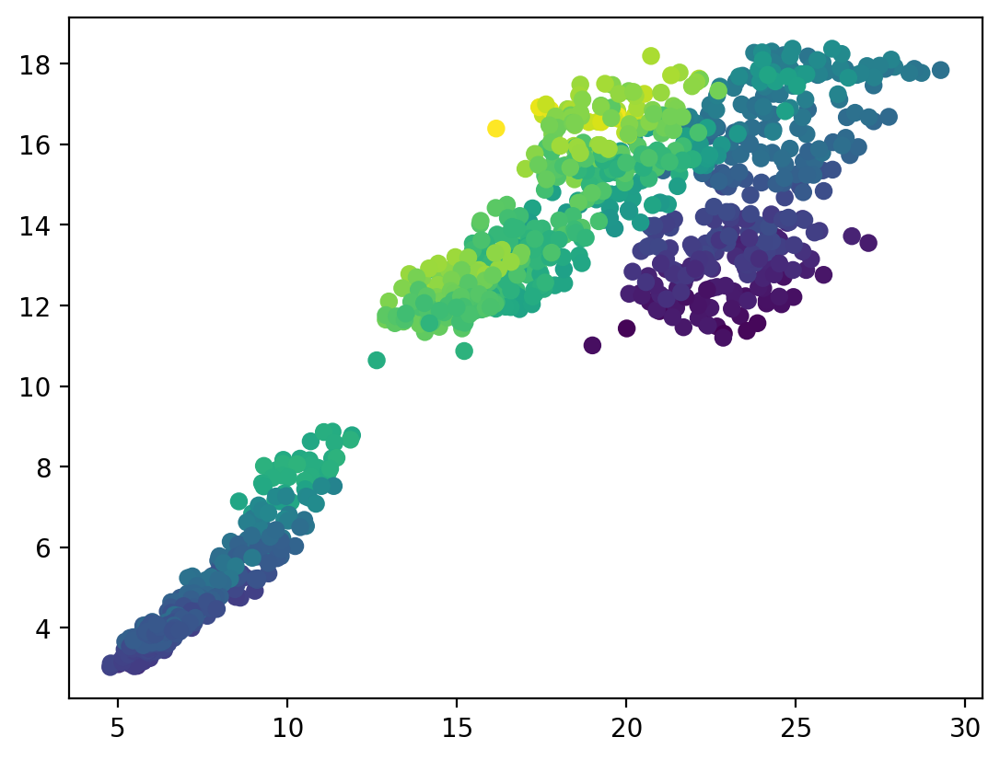

In [7]:
plt.scatter(prices["STAT"], prices["FREQ"], c=prices["AGE"], cmap="viridis")

In [8]:
prices_zscored = (prices - prices.mean()) / prices.std()
prices_zscored.head()

,FREQ,AGE,STAT
POS,,,
0,0.451735,-1.573882,1.631327
1,0.443429,-1.570811,1.068011
2,0.482884,-1.528342,1.227169
3,0.468348,-1.509922,1.242433
4,0.487037,-1.486896,1.559033


Plotting the prices over time suggests a strong correlation. However, the correlation seems to change over time.

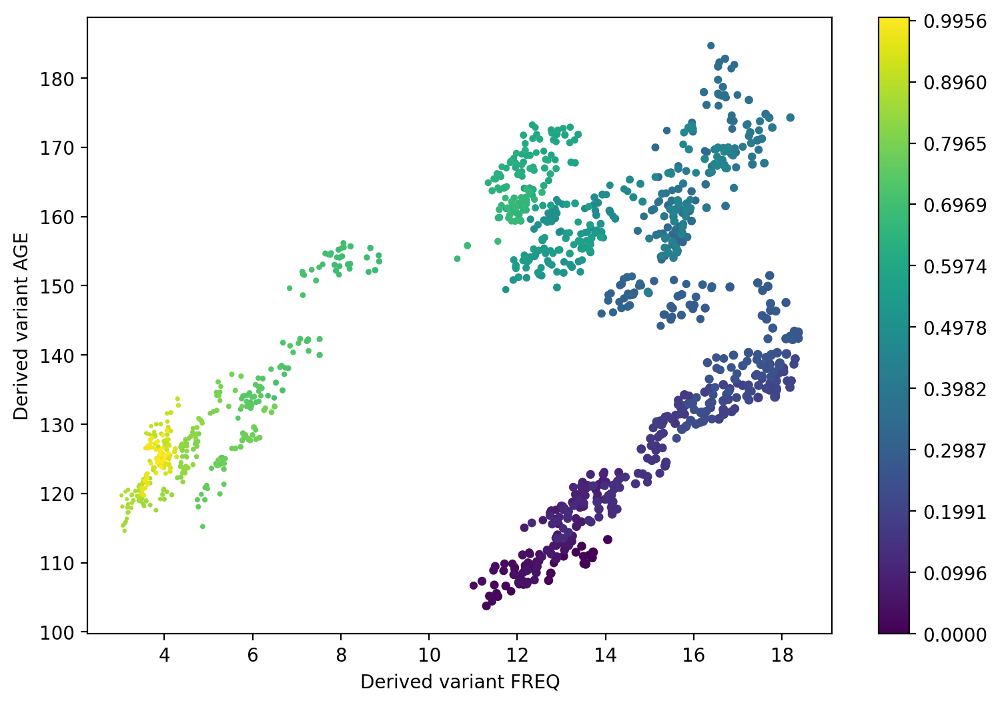

In [23]:
mymap = plt.get_cmap("viridis")

fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, xlabel=r"Derived variant FREQ", ylabel=r"Derived variant AGE")
colors = np.linspace(0, 1, len(prices))
sc = ax.scatter(prices.FREQ, prices.AGE, c=colors, cmap=mymap, s=prices.STAT, lw=0)
ticks = colors[:: len(prices) // 10]
#ticklabels = prices.index // 10 # [str(p.date()) for p in prices[:: len(prices) // 10].index]
cb = plt.colorbar(sc, ticks=ticks)
#cb.ax.set_yticklabels(ticklabels);

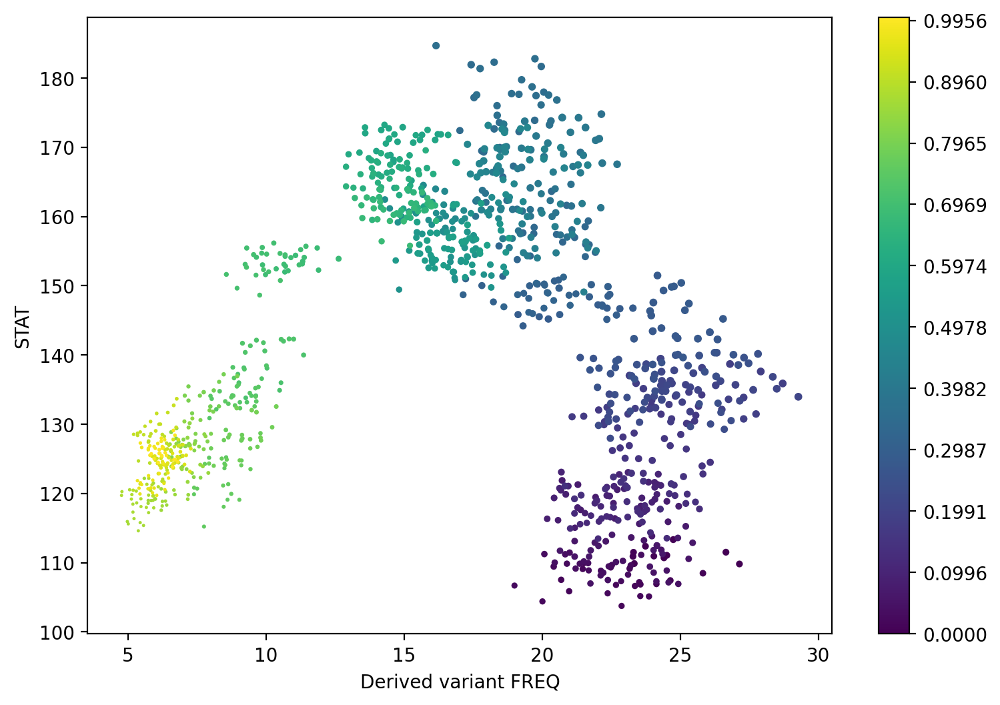

In [10]:
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, xlabel=r"Derived variant FREQ", ylabel=r"STAT")
colors = np.linspace(0, 1, len(prices))
mymap = plt.get_cmap("viridis")
sc = ax.scatter(prices.STAT, prices.AGE, c=colors, cmap=mymap, s=prices.FREQ, lw=0)
ticks = colors[:: len(prices) // 10]
#ticklabels = prices.index // 10 # [str(p.date()) for p in prices[:: len(prices) // 10].index]
cb = plt.colorbar(sc, ticks=ticks)
#cb.ax.set_yticklabels(ticklabels);

A naive approach would be to estimate a linear model and ignore the time domain.

In [37]:
with pm.Model() as model:  # model specifications in PyMC are wrapped in a with-statement
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    alpha = pm.Normal("alpha", mu=0, sigma=20)
    beta1 = pm.Normal("beta1", mu=0, sigma=20)
    beta2 = pm.Normal("beta2", mu=0, sigma=20)

    mu = pm.Deterministic("mu", alpha + beta1 * prices_zscored.FREQ.to_numpy() + beta2 * prices_zscored.STAT.to_numpy())

    # Define likelihood
    likelihood = pm.Normal("y", mu=mu, sigma=sigma, observed=prices_zscored.AGE.to_numpy())

    # Inference
    trace_reg = pm.sample(tune=2000)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, alpha, beta1, beta2]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 1 seconds.


The posterior predictive plot shows how bad the fit is.

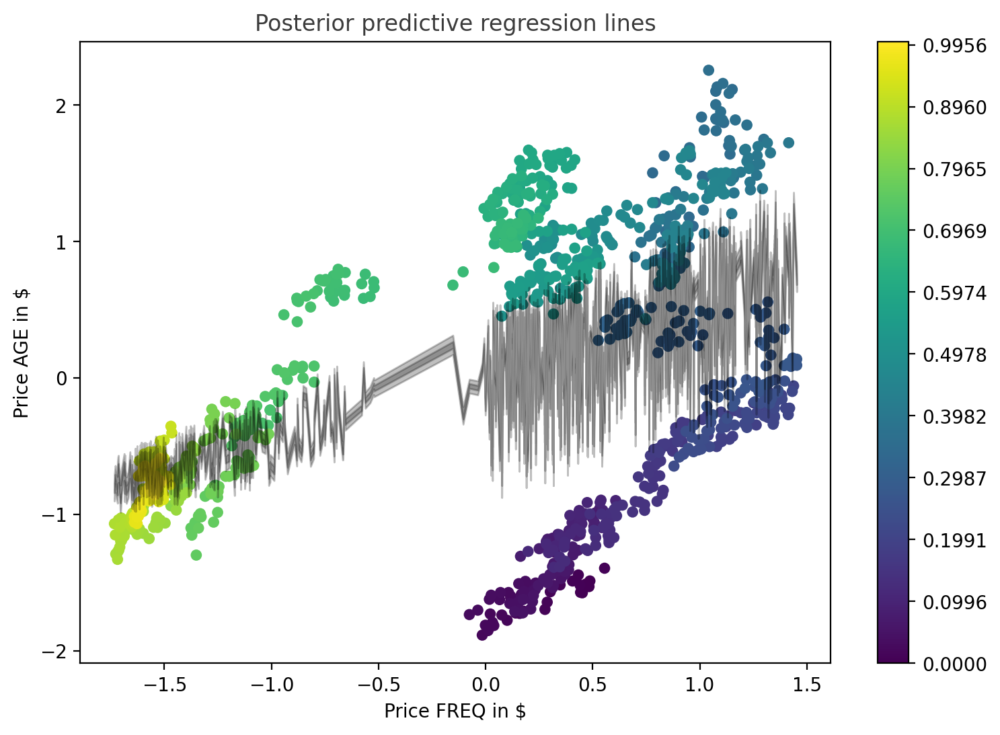

In [39]:
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(
    111,
    xlabel=r"Price FREQ in \$",
    ylabel=r"Price AGE in \$",
    title="Posterior predictive regression lines",
)
sc = ax.scatter(prices_zscored.FREQ, prices_zscored.AGE, c=colors, cmap=mymap, lw=0)

xi = xr.DataArray(prices_zscored.FREQ.values)
az.plot_hdi(
    xi,
    trace_reg.posterior.mu,
    color="k",
    hdi_prob=0.95,
    ax=ax,
    fill_kwargs={"alpha": 0.25},
    smooth=False,
)
az.plot_hdi(
    xi,
    trace_reg.posterior.mu,
    color="k",
    hdi_prob=0.5,
    ax=ax,
    fill_kwargs={"alpha": 0.25},
    smooth=False,
)

cb = plt.colorbar(sc, ticks=ticks)
# cb.ax.set_yticklabels(ticklabels);

## Rolling regression

Next, we will build an improved model that will allow for changes in the regression coefficients over time. Specifically, we will assume that intercept and slope follow a random-walk through time. That idea is similar to the {doc}`case_studies/stochastic_volatility`.

$$ \alpha_t \sim \mathcal{N}(\alpha_{t-1}, \sigma_\alpha^2) $$
$$ \beta_t \sim \mathcal{N}(\beta_{t-1}, \sigma_\beta^2) $$

First, lets define the hyper-priors for $\sigma_\alpha^2$ and $\sigma_\beta^2$. This parameter can be interpreted as the volatility in the regression coefficients.

In [60]:
with pm.Model(coords={"time": prices.index.values}) as model_randomwalk:
    # std of random walk
    sigma_alpha = pm.Exponential("sigma_alpha", 50.0)
    sigma_beta = pm.Exponential("sigma_beta", 50.0)

    # alpha = pm.GaussianRandomWalk(
    #     "alpha", sigma=sigma_alpha, init_dist=pm.Normal.dist(0, 10), dims="time"
    # )
    alpha = pm.Normal("alpha", mu=0, sigma=20)

    beta = pm.GaussianRandomWalk(
        "beta", sigma=sigma_beta, init_dist=pm.Normal.dist(0, 10), dims="time"
    )
    beta2 = pm.Normal("beta2", mu=0, sigma=20)


Perform the regression given coefficients and data and link to the data via the likelihood.

In [61]:
with model_randomwalk:
    # Define regression
    regression = alpha + beta * prices_zscored.FREQ.values + beta2 * prices_zscored.STAT.values

    # Assume prices are Normally distributed, the mean comes from the regression.
    sd = pm.HalfNormal("sd", sigma=0.1)
    likelihood = pm.Normal("y", mu=regression, sigma=sd, observed=prices_zscored.AGE.to_numpy())

Inference. Despite this being quite a complex model, NUTS handles it wells.

In [62]:
with model_randomwalk:
    trace_rw = pm.sample(tune=2000, target_accept=0.9)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_alpha, sigma_beta, alpha, beta, beta2, sd]


Output()

/Users/kmt/pymc/.pixi/envs/default/lib/python3.13/site-packages/pymc/step_methods/hmc/quadpotential.py:316: RuntimeWarning: overflow encountered in dot
  return 0.5 * np.dot(x, v_out)


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 27 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Increasing the tree-depth does indeed help but it makes sampling very slow. The results look identical with this run, however.

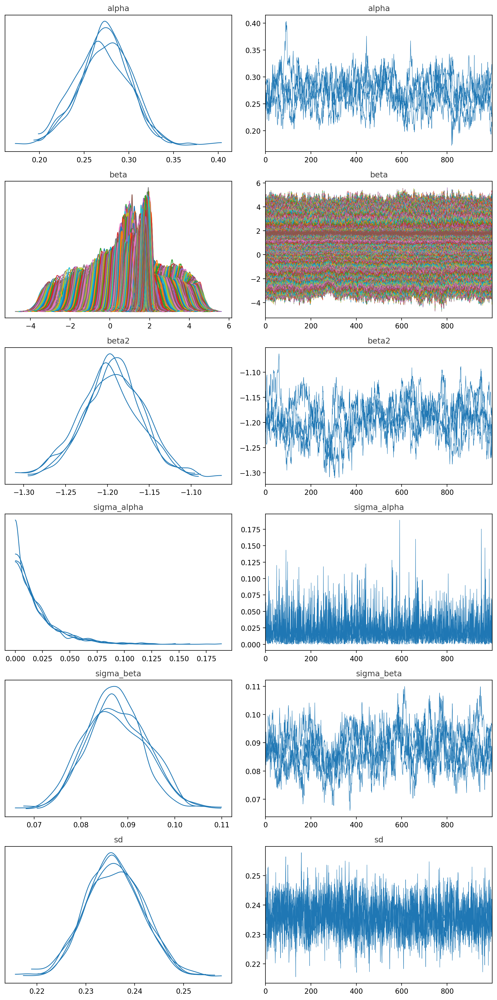

In [66]:
az.plot_trace(trace_rw,
    # var_names=[],
    compact=True,
    figsize=(10, 20),
    chain_prop=dict(linestyle='-'),
    trace_kwargs=dict(linestyle='-', linewidth=0.5, alpha=1),
             )
plt.tight_layout()

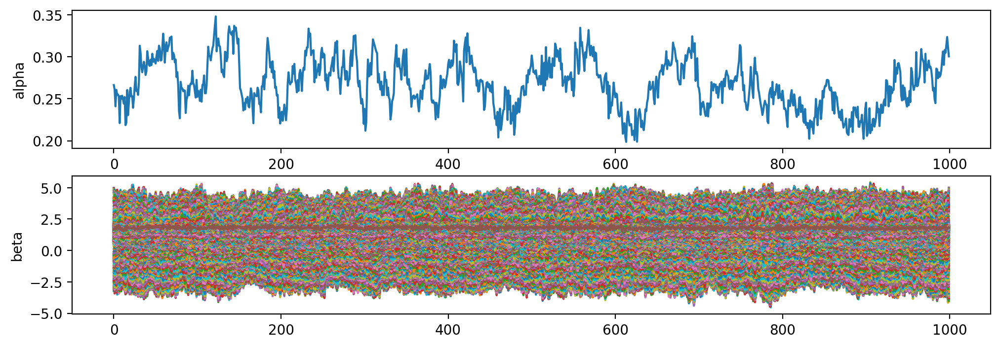

In [64]:
fig, axs = plt.subplots(nrows=2, figsize=(12,  4))
axs[0].plot(trace_rw.posterior.sel(chain=0)["alpha"])
axs[0].set(ylabel="alpha")
axs[1].plot(trace_rw.posterior.sel(chain=0)["beta"])
axs[1].set(ylabel="beta");

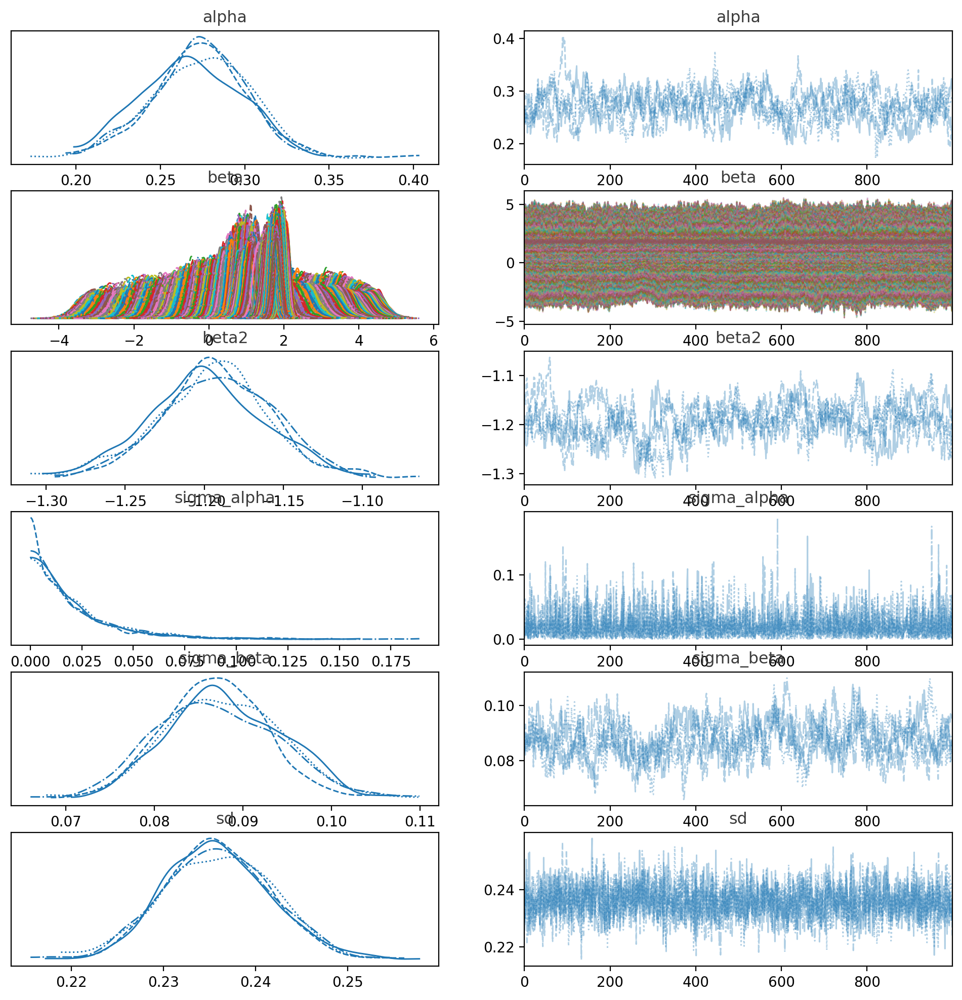

In [65]:
az.plot_trace(trace_rw);

In [33]:
az.summary(trace_rw)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],-1.838,0.066,-1.957,-1.711,0.006,0.003,109.0,272.0,1.06
alpha[1],-1.847,0.064,-1.965,-1.729,0.006,0.003,95.0,239.0,1.06
alpha[2],-1.828,0.068,-1.951,-1.696,0.007,0.003,91.0,253.0,1.06
alpha[3],-1.800,0.065,-1.922,-1.680,0.007,0.003,89.0,257.0,1.06
alpha[4],-1.779,0.067,-1.901,-1.651,0.007,0.003,85.0,216.0,1.07
...,...,...,...,...,...,...,...,...,...
beta[1670],1.532,0.260,1.065,1.982,0.070,0.028,16.0,45.0,1.21
beta2,-0.034,0.009,-0.052,-0.018,0.001,0.000,238.0,526.0,1.01
sigma_alpha,0.058,0.002,0.054,0.062,0.001,0.000,14.0,39.0,1.21
sigma_beta,0.024,0.004,0.017,0.031,0.001,0.000,14.0,48.0,1.21


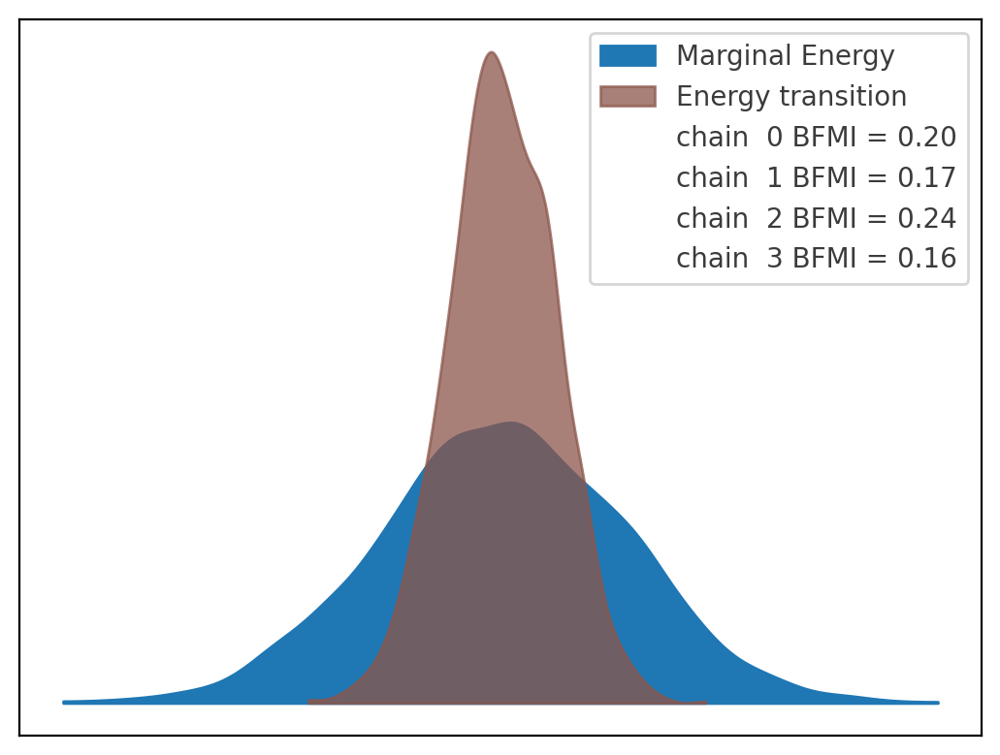

In [69]:
az.plot_energy(trace_rw);

## Analysis of results

As can be seen below, $\alpha$, the intercept, changes over time.

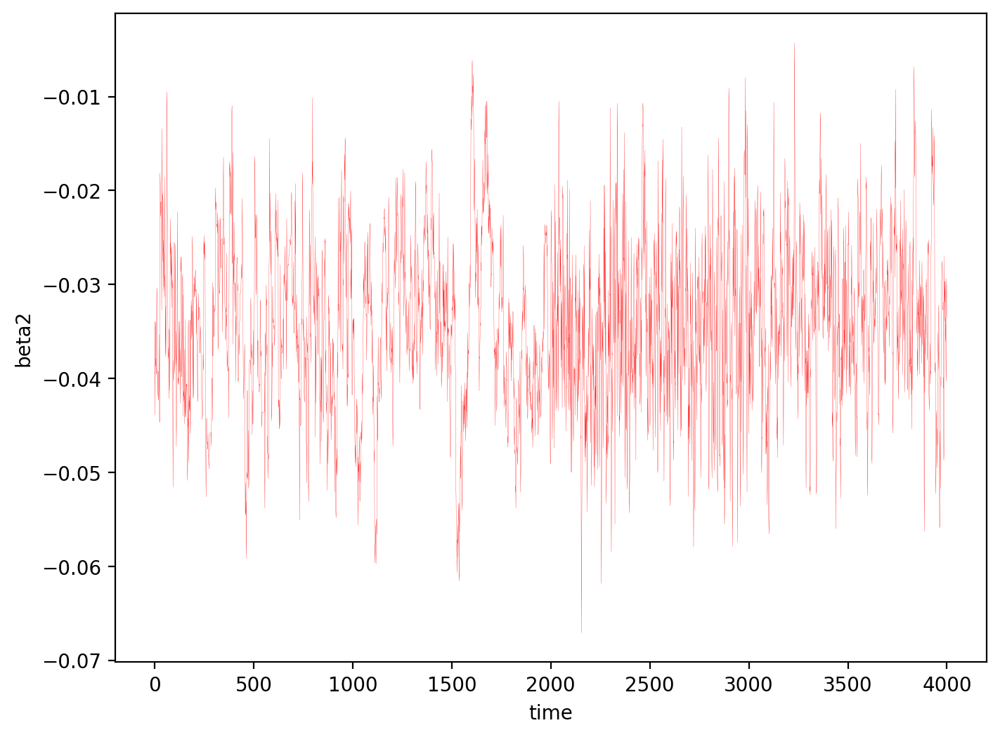

In [16]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = plt.subplot(111, xlabel="time", ylabel="beta2")
ax.plot(az.extract(trace_rw, var_names="beta2"), "r", linewidth=0.1, alpha=1) ;

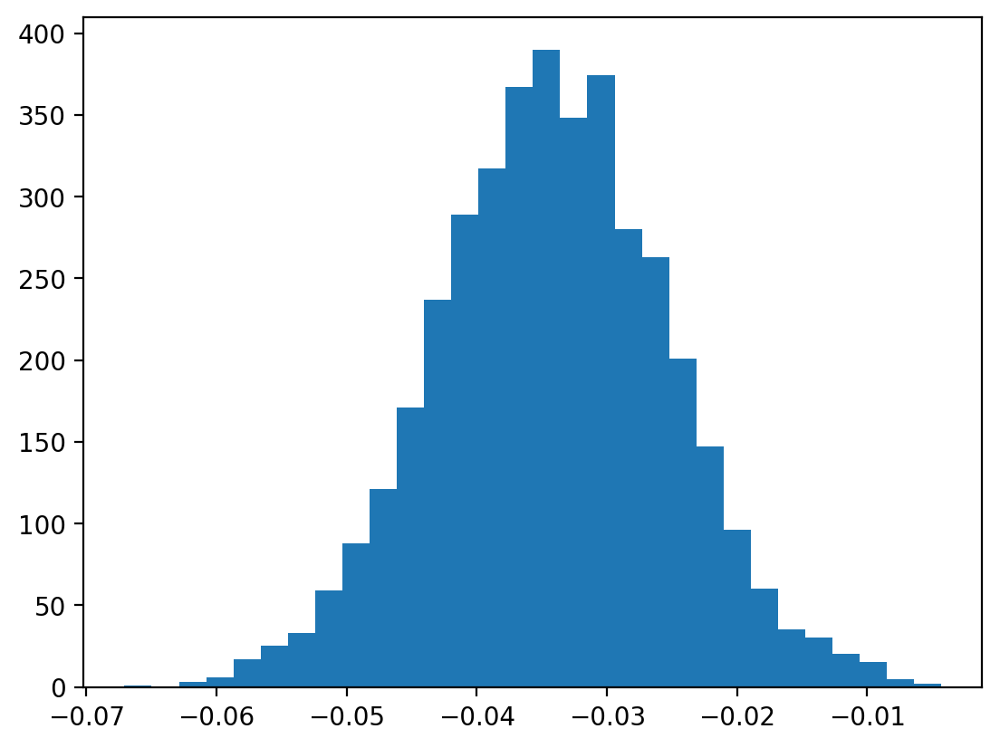

In [58]:
plt.hist(az.extract(trace_rw, var_names="beta2"), bins=30) ;

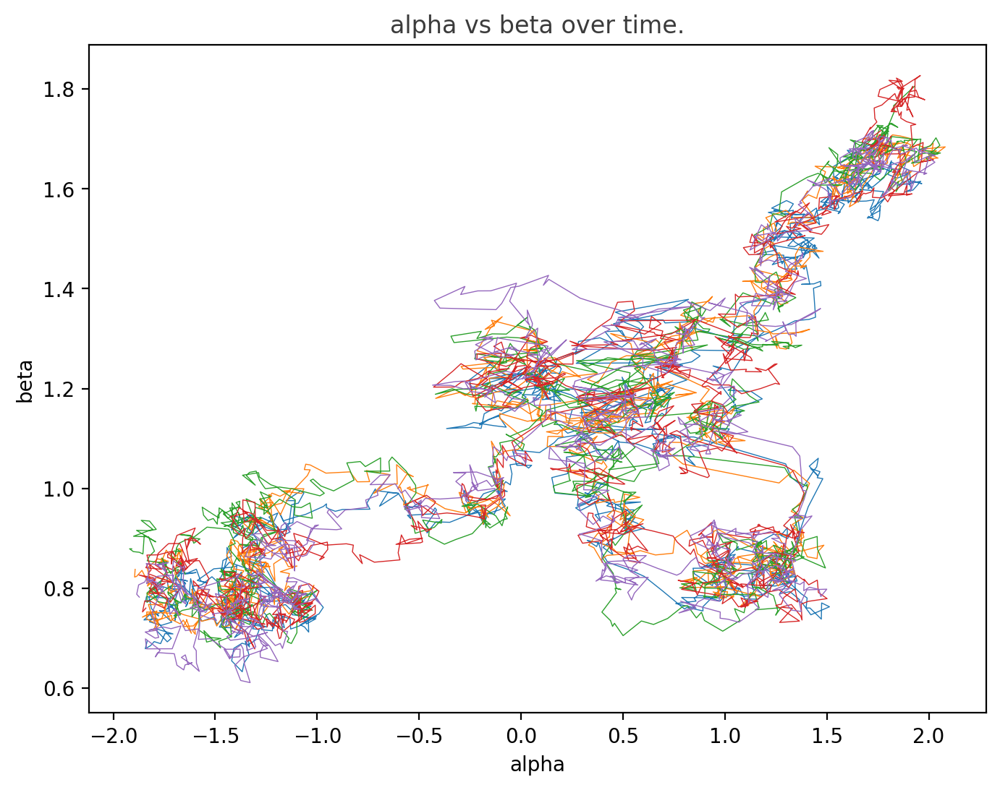

In [56]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = plt.subplot(111, xlabel="alpha", ylabel="beta", title="alpha vs beta over time.")
for i in range(5):
    ax.plot(trace_rw.posterior.sel(chain=0, draw=i)['alpha'], 
                trace_rw.posterior.sel(chain=0, draw=i)['beta'], linewidth=0.5) 


TypeError: Axes.scatter() missing 1 required positional argument: 'y'

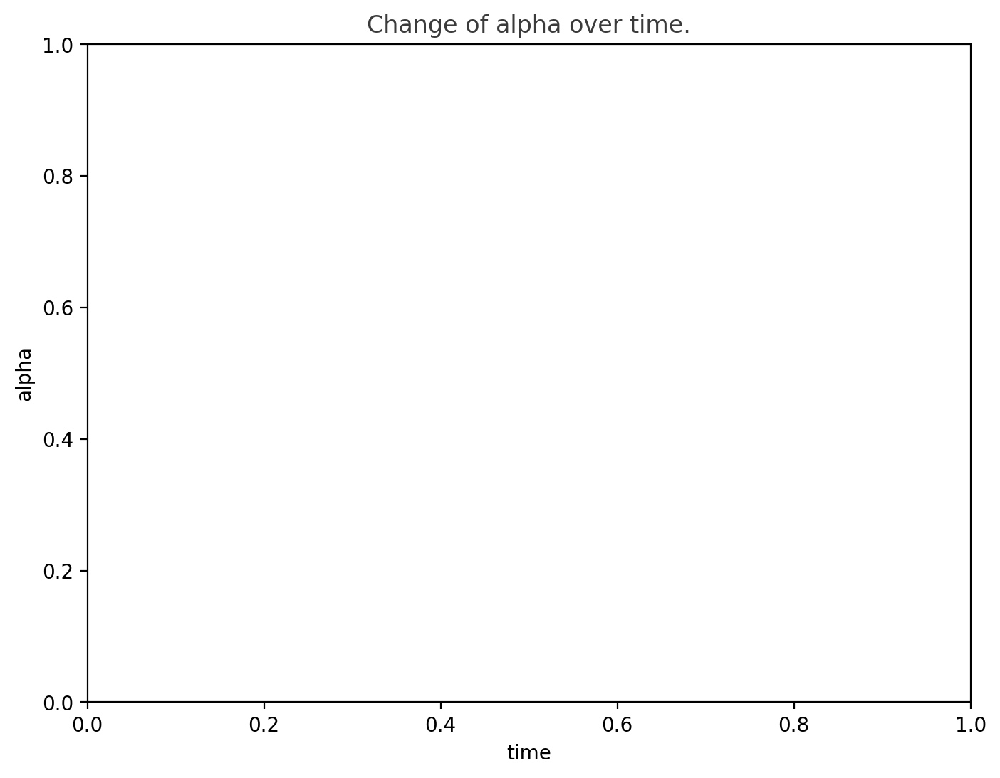

In [ ]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = plt.subplot(111, xlabel="time", ylabel="alpha", title="Change of alpha over time.")
ax.plot(az.extract(trace_rw, var_names="alpha"), linewidth=0.1, alpha=0.05)

ticks_changes = mticker.FixedLocator(ax.get_xticks().tolist())
# ticklabels_changes = [str(p.date()) for p in prices[:: len(prices) // 7].index]
# ax.xaxis.set_major_locator(ticks_changes)
# ax.set_xticklabels(ticklabels_changes)

fig.autofmt_xdate()

As does the slope.

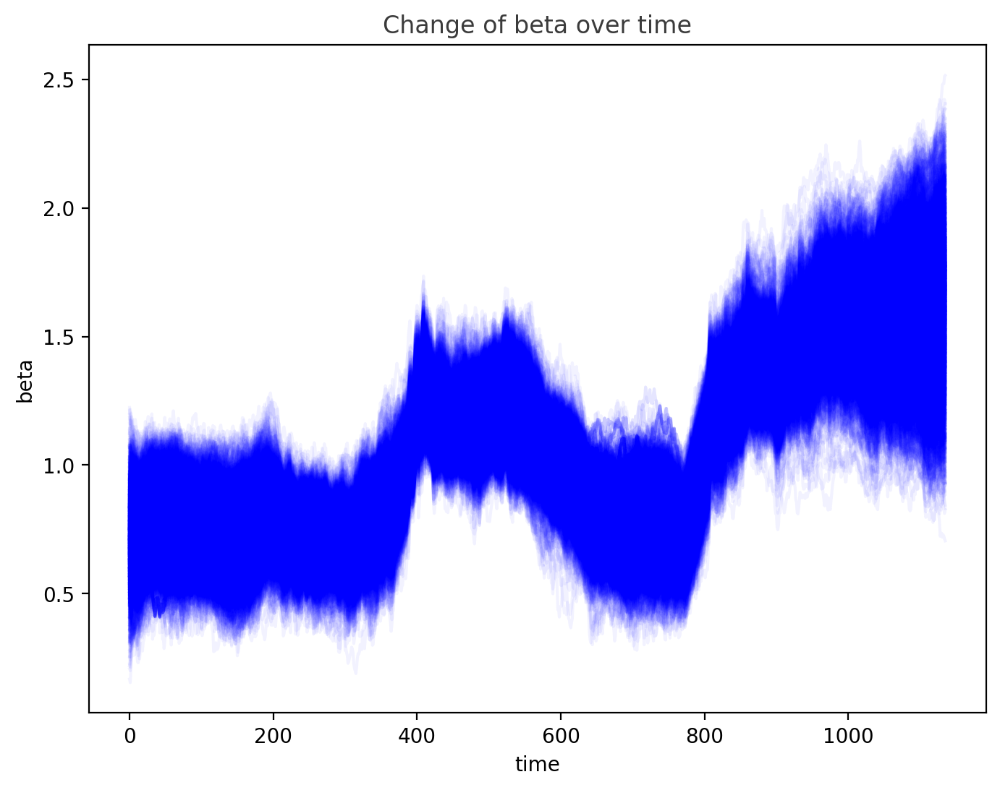

In [50]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta", title="Change of beta over time")
ax.plot(az.extract(trace_rw, var_names="beta"), "b", alpha=0.05) ;

# ax.xaxis.set_major_locator(ticks_changes)
# ax.set_xticklabels(ticklabels_changes)

# fig.autofmt_xdate()

The posterior predictive plot shows that we capture the change in regression over time much better. Note that we should have used returns instead of prices. The model would still work the same, but the visualisations would not be quite as clear.

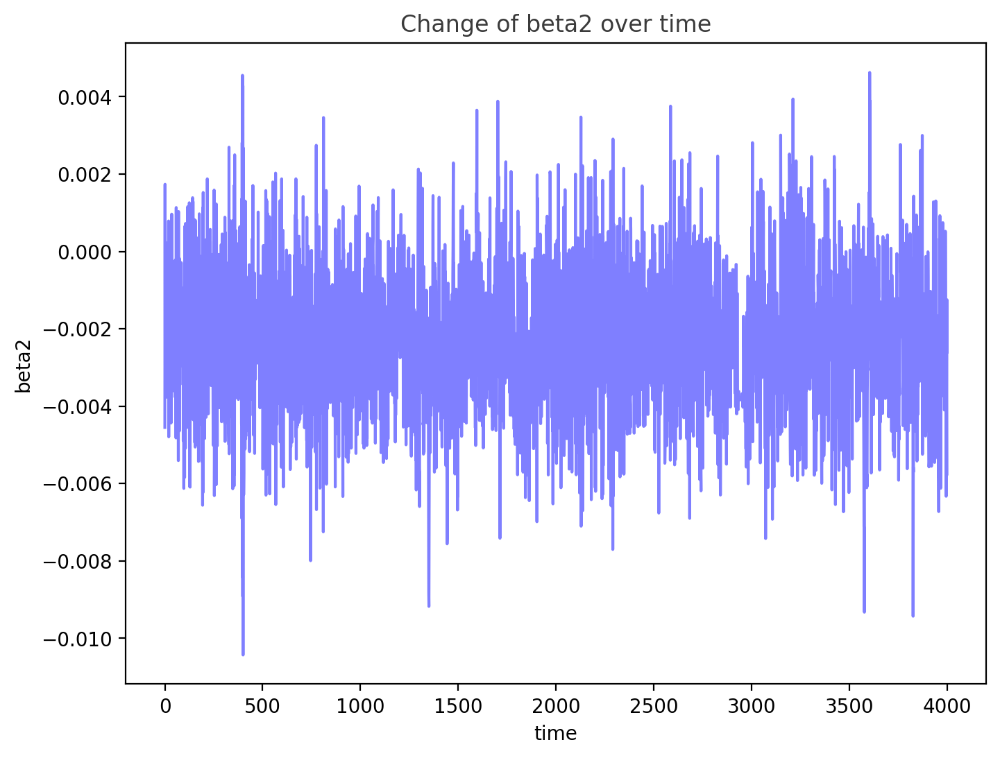

In [52]:
fig = plt.figure(figsize=(8, 6), constrained_layout=False)
ax = fig.add_subplot(111, xlabel="time", ylabel="beta2", title="Change of beta2 over time")
ax.plot(az.extract(trace_rw, var_names="beta2"), "b", alpha=0.5) ;

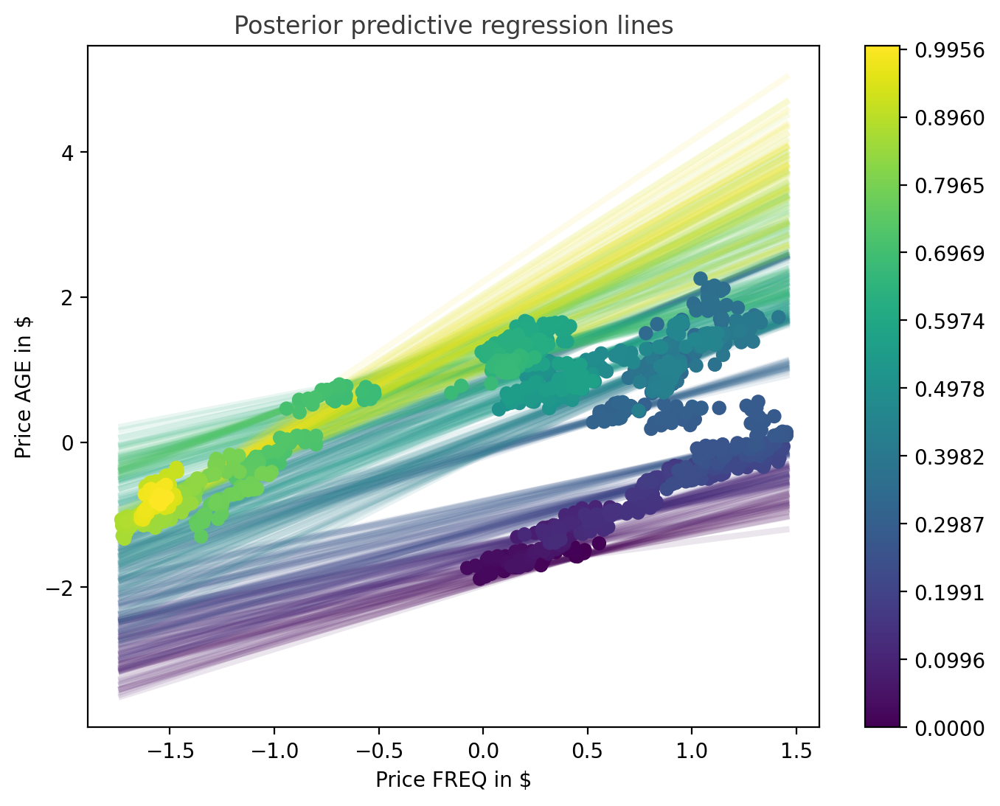

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(
    111,
    xlabel=r"Price FREQ in \$",
    ylabel=r"Price AGE in \$",
    title="Posterior predictive regression lines",
)

colors = np.linspace(0, 1, len(prices))
colors_sc = np.linspace(0, 1, len(prices.index.values[::50]))

xi = xr.DataArray(np.linspace(prices_zscored.FREQ.min(), prices_zscored.FREQ.max(), 50))
xi2 = xr.DataArray(np.linspace(prices_zscored.STAT.min(), prices_zscored.STAT.max(), 50))

for i, time in enumerate(prices.index.values[::50]):
    sel_trace = az.extract(trace_rw).sel(time=time)
    regression_line = sel_trace["alpha"] + sel_trace["beta"] * xi + sel_trace["beta2"] * xi2
    ax.plot(
        xi,
        regression_line.T[:, 0::200],
        color=mymap(colors_sc[i]),
        alpha=0.1,
        zorder=10,
        linewidth=3,
    )

sc = ax.scatter(
    prices_zscored.FREQ, prices_zscored.AGE, label="data", cmap=mymap, c=colors, zorder=11
)

cb = plt.colorbar(sc, ticks=ticks) ;
# cb.ax.set_yticklabels(ticklabels);

## Authors

- Created by [Thomas Wiecki](https://github.com/twiecki/)
- Updated by [Benjamin T. Vincent](https://github.com/drbenvincent) June 2022
- Run PyMC v5 by Reshama Shaikh, January 2023
- Updated to use `az.extract` by [Benjamin T. Vincent](https://github.com/drbenvincent) in February 2023 ([pymc-examples#522](https://github.com/pymc-devs/pymc-examples/pull/522))

## Watermark

In [13]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor,aeppl,xarray

Last updated: Sun Feb 05 2023

Python implementation: CPython
Python version       : 3.10.9
IPython version      : 8.9.0

pytensor: 2.8.11
aeppl   : not installed
xarray  : 2023.1.0

arviz     : 0.14.0
xarray    : 2023.1.0
numpy     : 1.24.1
matplotlib: 3.6.3
pymc      : 5.0.1
pandas    : 1.5.3

Watermark: 2.3.1



:::{include} ../page_footer.md
:::